In [ ]:
!pip -q install segmentation-models-pytorch albumentations opencv-python numba
!pip -q install -U albumentations numba

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.9/273.9 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 66.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 39.0 MB/s eta 0:00:00


In [ ]:
!python --version

Python 3.11.11


In [ ]:
# Standard Libraries
import os
import random
import shutil
import csv
import json
import gc
import numpy as np

# Visualization
import matplotlib.pyplot as plt

# Google Colab
from google.colab import drive

# OpenCV
import cv2

# PyTorch and related libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import KFold
from sklearn.metrics import (precision_score, recall_score, f1_score, confusion_matrix)

# Segmentation Models and Augmentations
import segmentation_models_pytorch as smp
from albumentations import (Compose, HorizontalFlip, VerticalFlip, RandomRotate90, Normalize)
from albumentations.pytorch import ToTensorV2

# Numba
from numba import cuda

---------------------------Split Data------------------------------------------

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Path to your main dataset folder in Drive
BASE_DIR = '/content/drive/MyDrive/mask-semantic/'
IMAGES_DIR = os.path.join(BASE_DIR, 'images')
MASKS_DIR = os.path.join(BASE_DIR, 'masks')

In [ ]:
EXAMPLE_IMG = os.path.join(BASE_DIR, 'exampleImages')
EXAMPLE_IMG_MASKS = os.path.join(BASE_DIR, 'exampleImagesMasks')

In [ ]:
# Create subfolders for train, val, test
TRAIN_IMAGES_DIR = os.path.join(BASE_DIR, 'train_images')
TRAIN_MASKS_DIR  = os.path.join(BASE_DIR, 'train_masks')

VAL_IMAGES_DIR = os.path.join(BASE_DIR, 'val_images')
VAL_MASKS_DIR  = os.path.join(BASE_DIR, 'val_masks')

TEST_IMAGES_DIR = os.path.join(BASE_DIR, 'test_images')
TEST_MASKS_DIR  = os.path.join(BASE_DIR, 'test_masks')

# Paths to K-fold data directories
OUTPUT_TRAIN_DIR = os.path.join(BASE_DIR, 'k-fold-train')
OUTPUT_TEST_DIR = os.path.join(BASE_DIR, 'k-fold-test')

# Make sure all subfolders exist
os.makedirs(TRAIN_IMAGES_DIR, exist_ok=True)
os.makedirs(TRAIN_MASKS_DIR,  exist_ok=True)
os.makedirs(VAL_IMAGES_DIR,   exist_ok=True)
os.makedirs(VAL_MASKS_DIR,    exist_ok=True)
os.makedirs(TEST_IMAGES_DIR,  exist_ok=True)
os.makedirs(TEST_MASKS_DIR,   exist_ok=True)
os.makedirs(OUTPUT_TRAIN_DIR,  exist_ok=True)
os.makedirs(OUTPUT_TEST_DIR,   exist_ok=True)

# Define folder paths
folders = [
    TRAIN_IMAGES_DIR,
    TRAIN_MASKS_DIR,
    VAL_IMAGES_DIR,
    VAL_MASKS_DIR,
    TEST_IMAGES_DIR,
    TEST_MASKS_DIR
]

In [ ]:
def read_class_mapping(csv_path):
    class_to_idx = {}
    idx_to_class = []

    with open(csv_path, 'r') as f:
        reader = csv.DictReader(f)

        # Normalize headers
        reader.fieldnames = [header.strip() for header in reader.fieldnames]
        print("CSV Headers (normalized):", reader.fieldnames)  # Debugging headers

        for row in reader:
            # Normalize row keys
            row = {key.strip(): value for key, value in row.items()}
            print("Row Keys (normalized):", row.keys())  # Debugging row keys

            pixel_value = int(row["Pixel Value"])
            class_name = row["Class"].strip()  # Strip spaces from values too

            if pixel_value not in class_to_idx:
                class_to_idx[pixel_value] = len(idx_to_class)
                idx_to_class.append(class_name)

    return class_to_idx, idx_to_class

csv_path = "/content/drive/MyDrive/mask-semantic/_classes.csv"
class_to_idx, idx_to_class = read_class_mapping(csv_path)
print("class_to_idx:", class_to_idx)
print("idx_to_class:", idx_to_class)


CSV Headers (normalized): ['Pixel Value', 'Class']
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
class_to_idx: {0: 0, 1: 1, 2: 2, 3: 3}
idx_to_class: ['background', 'dimensions', 'floorplan', 'rooms']


In [ ]:
class FloorPlanDataset(Dataset):
    """
    A PyTorch Dataset class for multi-class floor plan segmentation.

    Arguments:
        images_dir   (str): Path to the directory containing images.
        masks_dir    (str): Path to the directory containing masks.
        class_to_idx (dict): Mapping { original_pixel_value: new_class_index }.
        transform    (callable, optional): A function/transform to apply on the image and mask.
    """
    def __init__(self, images_dir, masks_dir, class_to_idx, transform=None):
        self.images_dir   = images_dir
        self.masks_dir    = masks_dir
        self.image_names  = sorted(os.listdir(images_dir))
        self.mask_names   = sorted(os.listdir(masks_dir))
        self.class_to_idx = class_to_idx
        self.transform    = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        # Full paths
        img_path  = os.path.join(self.images_dir, self.image_names[idx])
        mask_path = os.path.join(self.masks_dir, self.mask_names[idx])

        # Read image (BGR -> RGB)
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Read mask in grayscale
        mask  = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Dynamically remap mask pixel values to [0..N-1]
        # If the mask contains pixel values not in class_to_idx, map them to 0 or raise an error.
        mask_mapped = np.zeros_like(mask, dtype=np.int64)  # same H x W, but integer type
        for unique_val in np.unique(mask):
            if unique_val in self.class_to_idx:
                mask_mapped[mask == unique_val] = self.class_to_idx[unique_val]
            else:
                # If you prefer to ignore unrecognized classes, map them to 0 (background).
                mask_mapped[mask == unique_val] = 0
                # Or raise ValueError if you want strict checking:
                # raise ValueError(f"Pixel value {unique_val} not found in class_to_idx mapping.")

        # Apply transforms (if any)
        if self.transform:
            augmented = self.transform(image=image, mask=mask_mapped)
            image = augmented['image']
            mask  = augmented['mask']
        else:
            # Convert to PyTorch tensors
            image = torch.from_numpy(image.transpose(2, 0, 1)).float()
            mask  = torch.from_numpy(mask_mapped).long()

        return image, mask


In [ ]:
train_transform = Compose([
    HorizontalFlip(p=0.5),
    VerticalFlip(p=0.5),
    Normalize(mean=(0.5), std=(0.5)),
    ToTensorV2(),])

val_transform = Compose([
    Normalize(mean=(0.5), std=(0.5)),
    ToTensorV2(),])

test_transform = Compose([
    Normalize(mean=(0.5), std=(0.5)),
    ToTensorV2(),])

In [ ]:
# 1. Read the CSV file to get the dynamic class mapping
csv_path = "/content/drive/MyDrive/mask-semantic/_classes.csv"
class_to_idx, idx_to_class = read_class_mapping(csv_path)

# 2. Specify directories for train, val, test
TRAIN_IMAGES_DIR = "/content/drive/MyDrive/mask-semantic/train_images"
TRAIN_MASKS_DIR  = "/content/drive/MyDrive/mask-semantic/train_masks"
VAL_IMAGES_DIR   = "/content/drive/MyDrive/mask-semantic/val_images"
VAL_MASKS_DIR    = "/content/drive/MyDrive/mask-semantic/val_masks"
TEST_IMAGES_DIR  = "/content/drive/MyDrive/mask-semantic/test_images"
TEST_MASKS_DIR   = "/content/drive/MyDrive/mask-semantic/test_masks"
EXP_IMG_DIR   = "/content/drive/MyDrive/mask-semantic/exampleImages"
EXP_MASKS_DIR   = "/content/drive/MyDrive/mask-semantic/exampleImagesMasks"

# 3. Create datasets
train_dataset = FloorPlanDataset(
    images_dir=TRAIN_IMAGES_DIR,
    masks_dir=TRAIN_MASKS_DIR,
    class_to_idx=class_to_idx,
    transform=train_transform)

val_dataset = FloorPlanDataset(
    images_dir=VAL_IMAGES_DIR,
    masks_dir=VAL_MASKS_DIR,
    class_to_idx=class_to_idx,
    transform=val_transform)

test_dataset = FloorPlanDataset(
    images_dir=TEST_IMAGES_DIR,
    masks_dir=TEST_MASKS_DIR,
    class_to_idx=class_to_idx,
    transform=test_transform)

example_dataset = FloorPlanDataset(
    images_dir=EXP_IMG_DIR,
    masks_dir=EXP_MASKS_DIR,
    class_to_idx=class_to_idx,
    transform=test_transform)

# 4. Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=2)
exp_loader  = DataLoader(example_dataset,  batch_size=16, shuffle=False, num_workers=2)

print("Class mapping (pixel_value -> index):", class_to_idx)
print("Index to class name:", idx_to_class)
print("Number of training samples:", len(train_dataset))
print("Number of validation samples:", len(val_dataset))
print("Number of test samples:", len(test_dataset))


CSV Headers (normalized): ['Pixel Value', 'Class']
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Row Keys (normalized): dict_keys(['Pixel Value', 'Class'])
Class mapping (pixel_value -> index): {0: 0, 1: 1, 2: 2, 3: 3}
Index to class name: ['background', 'dimensions', 'floorplan', 'rooms']
Number of training samples: 836
Number of validation samples: 0
Number of test samples: 210


In [ ]:
# Number of classes
num_classes = len(idx_to_class)

# Model configurations
model_config = {
    "deeplabv3plus": {
        "model": smp.DeepLabV3Plus,
        "encoders": ["efficientnet-b3","resnet101", "resnet152"],
    },
    "fpn": {
        "model": smp.FPN,
        "encoders": ["efficientnet-b0", "efficientnet-b1","efficientnet-b3" ,"resnet50", "resnet101", "resnet152"],
    },
    "linknet": {
        "model": smp.Linknet,
        "encoders": ["resnet34", "resnet50", "resnet101", "resnet152"],
    },
    "pspnet": {
        "model": smp.PSPNet,
        "encoders": ["resnet50", "resnet101", "resnet152"],
    },
    "unet": {
        "model": smp.Unet,
        "encoders": ["efficientnet-b0", "efficientnet-b1","efficientnet-b3", "efficientnet-b4", "resnet34", "resnet50", "resnet101", "resnet152"],
    }}

# Select model by name
selected_model_name = "unet"
config = model_config[selected_model_name]

# Choose an encoder (select the first one by default or specify)
selected_encoder = config["encoders"][6]

# Initialize the model
model = config["model"](
    encoder_name=selected_encoder,
    in_channels=1,
    classes=num_classes,
    activation=None)

# Move model to device
device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)

# Define loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

-----------------------------------------------------------

In [ ]:
def multiclass_dice_coeff(pred, target, num_classes, smooth=1e-6):
    """
    pred: (N, C, H, W) raw logits
    target: (N, H, W) class indices
    Returns the mean Dice over all classes.
    """
    # Convert logits to probabilities
    pred_probs = torch.softmax(pred, dim=1)  # (N,C,H,W)

    dice_per_class = []
    for class_idx in range(num_classes):
        # Probability map for this class
        pred_class = pred_probs[:, class_idx, :, :]
        # Ground-truth mask for this class
        target_class = (target == class_idx).float()

        intersection = (pred_class * target_class).sum()
        union = pred_class.sum() + target_class.sum()
        dice_score = (2.0 * intersection + smooth) / (union + smooth)
        dice_per_class.append(dice_score)

    return torch.mean(torch.stack(dice_per_class))

----------------------------------------

K-FOLD TRAINING

In [ ]:
# Configuration
num_folds = 5  # Number of folds
num_epochs = 30
scheduler_step_size = 10
scheduler_gamma = 0.5
early_stopping_patience = 5
tolerance = 1e-4

# K-fold training
fold_results = []
for fold in range(1, num_folds + 1):
    print(f"Starting Fold {fold}/{num_folds}...")

    # Paths for the current fold
    train_images_dir = os.path.join(OUTPUT_TRAIN_DIR, f'fold_{fold}', 'images')
    train_masks_dir = os.path.join(OUTPUT_TRAIN_DIR, f'fold_{fold}', 'masks')
    test_images_dir = os.path.join(OUTPUT_TEST_DIR, f'fold_{fold}', 'images')
    test_masks_dir = os.path.join(OUTPUT_TEST_DIR, f'fold_{fold}', 'masks')

    # Create datasets and data loaders for this fold
    train_dataset = FloorPlanDataset(train_images_dir, train_masks_dir, class_to_idx, transform=train_transform)
    test_dataset = FloorPlanDataset(test_images_dir, test_masks_dir, class_to_idx, transform=test_transform)

    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=False)

    # Initialize model, optimizer, scheduler, and loss function
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=scheduler_step_size, gamma=scheduler_gamma)
    loss_fn = nn.CrossEntropyLoss()

    best_val_loss = float('inf')
    patience_counter = 0
    best_val_confusion_matrix = None

    for epoch in range(num_epochs):
        # ---- Train ----
        model.train()
        train_loss = 0.0
        train_dice = 0.0
        train_correct_pixels = 0
        train_total_pixels = 0

        for images, masks in train_loader:
            images = images.to(device).float()
            masks = masks.to(device).long()

            optimizer.zero_grad()
            outputs = model(images)

            loss = loss_fn(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_dice += multiclass_dice_coeff(outputs, masks, num_classes=len(idx_to_class)).item()
            preds = torch.argmax(outputs, dim=1)
            train_correct_pixels += (preds == masks).sum().item()
            train_total_pixels += masks.numel()

        train_loss /= len(train_loader)
        train_dice /= len(train_loader)
        train_accuracy = train_correct_pixels / train_total_pixels

        # ---- Validation ----
        model.eval()
        val_loss = 0.0
        val_dice = 0.0
        val_correct_pixels = 0
        val_total_pixels = 0
        all_preds = []
        all_masks = []

        with torch.no_grad():
            for images, masks in test_loader:
                images = images.to(device).float()
                masks = masks.to(device).long()

                outputs = model(images)
                loss = loss_fn(outputs, masks)
                val_loss += loss.item()
                val_dice += multiclass_dice_coeff(outputs, masks, num_classes=len(idx_to_class)).item()

                preds = torch.argmax(outputs, dim=1)
                val_correct_pixels += (preds == masks).sum().item()
                val_total_pixels += masks.numel()

                all_preds.extend(preds.cpu().numpy().flatten())
                all_masks.extend(masks.cpu().numpy().flatten())

        val_loss /= len(test_loader)
        val_dice /= len(test_loader)
        val_accuracy = val_correct_pixels / val_total_pixels

        all_preds = np.array(all_preds)
        all_masks = np.array(all_masks)

        val_precision = precision_score(all_masks, all_preds, average='weighted', zero_division=0)
        val_recall = recall_score(all_masks, all_preds, average='weighted', zero_division=0)
        val_f1 = f1_score(all_masks, all_preds, average='weighted', zero_division=0)
        val_confusion_matrix = confusion_matrix(all_masks, all_preds, labels=list(range(len(idx_to_class))))

        # Save the confusion matrix of the best model
        if val_loss < best_val_loss - tolerance:
            best_val_loss = val_loss
            patience_counter = 0
            best_val_confusion_matrix = val_confusion_matrix
        else:
            patience_counter += 1

        # Early stopping check
        if patience_counter >= early_stopping_patience:
            print(f"Early stopping triggered at epoch {epoch+1} for fold {fold}!")
            break

        scheduler.step()

        # Detailed log
        print(
            f"Fold {fold}, Epoch [{epoch+1}/{num_epochs}] "
            f"Train Loss: {train_loss:.4f}, Train Dice: {train_dice:.4f}, Train Accuracy: {train_accuracy:.4f} | "
            f"Val Loss: {val_loss:.4f} (Best: {best_val_loss:.4f}), Val Dice: {val_dice:.4f}, Val Accuracy: {val_accuracy:.4f} | "
            f"Precision: {val_precision:.4f}, Recall: {val_recall:.4f}, F1: {val_f1:.4f} | "
            f"Patience Counter: {patience_counter}"
        )

    # Log fold results
    fold_results.append({
        'fold': fold,
        'best_val_loss': best_val_loss,
        'val_precision': val_precision,
        'val_recall': val_recall,
        'val_f1': val_f1,
        'confusion_matrix': best_val_confusion_matrix
    })

# Final results summary
print("K-Fold Training Completed!\n")
for result in fold_results:
    print(f"Fold {result['fold']} Results:")
    print(f"Best Validation Loss: {result['best_val_loss']:.4f}")
    print(f"Precision: {result['val_precision']:.4f}, Recall: {result['val_recall']:.4f}, F1: {result['val_f1']:.4f}")
    print(f"Confusion Matrix:\n{result['confusion_matrix']}\n")


-----------------------------

In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)  # Decay LR every 10 epochs
num_classes = len(idx_to_class)
num_epochs = 100

for epoch in range(num_epochs):
    # ---- Train ----
    model.train()
    train_loss = 0.0
    train_dice = 0.0
    train_correct_pixels = 0
    train_total_pixels = 0

    for images, masks in train_loader:
        images = images.to(device).float()
        masks = masks.to(device).long()

        optimizer.zero_grad()
        outputs = model(images)

        loss = loss_fn(outputs, masks)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_dice += multiclass_dice_coeff(outputs, masks, num_classes=num_classes).item()
        preds = torch.argmax(outputs, dim=1)
        train_correct_pixels += (preds == masks).sum().item()
        train_total_pixels += masks.numel()

    train_loss /= len(train_loader)
    train_dice /= len(train_loader)
    train_accuracy = train_correct_pixels / train_total_pixels

    scheduler.step()

    # Detailed log
    print(
        f"Epoch [{epoch+1}/{num_epochs}] "
        f"Train Loss: {train_loss:.4f}, Train Dice: {train_dice:.4f}, Train Accuracy: {train_accuracy:.4f} | "
    )

print("Training completed!")

---------------------------------------------


precision,recal, f1 score part

In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)  # Decay LR every 10 epochs
early_stopping_patience = 15
tolerance = 1e-4  # Tolerance for small validation loss changes
num_classes = len(idx_to_class)
num_epochs = 100

best_val_loss = float('inf')  # Initialize best validation loss for early stopping
patience_counter = 0
best_val_confusion_matrix = None

for epoch in range(num_epochs):
    # ---- Train ----
    model.train()
    train_loss = 0.0
    train_dice = 0.0
    train_correct_pixels = 0
    train_total_pixels = 0

    for images, masks in train_loader:
        images = images.to(device).float()
        masks = masks.to(device).long()

        optimizer.zero_grad()
        outputs = model(images)

        loss = loss_fn(outputs, masks)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_dice += multiclass_dice_coeff(outputs, masks, num_classes=num_classes).item()
        preds = torch.argmax(outputs, dim=1)
        train_correct_pixels += (preds == masks).sum().item()
        train_total_pixels += masks.numel()

    train_loss /= len(train_loader)
    train_dice /= len(train_loader)
    train_accuracy = train_correct_pixels / train_total_pixels

    # ---- Validation ----
    model.eval()
    val_loss = 0.0
    val_dice = 0.0
    val_correct_pixels = 0
    val_total_pixels = 0
    all_preds = []
    all_masks = []

    with torch.no_grad():
        for images, masks in val_loader:
            images = images.to(device).float()
            masks = masks.to(device).long()

            outputs = model(images)
            loss = loss_fn(outputs, masks)
            val_loss += loss.item()
            val_dice += multiclass_dice_coeff(outputs, masks, num_classes=num_classes).item()

            preds = torch.argmax(outputs, dim=1)
            val_correct_pixels += (preds == masks).sum().item()
            val_total_pixels += masks.numel()

            all_preds.extend(preds.cpu().numpy().flatten())
            all_masks.extend(masks.cpu().numpy().flatten())

    val_loss /= len(val_loader)
    val_dice /= len(val_loader)
    val_accuracy = val_correct_pixels / val_total_pixels

    all_preds = np.array(all_preds)
    all_masks = np.array(all_masks)

    val_precision = precision_score(all_masks, all_preds, average='weighted', zero_division=0)
    val_recall = recall_score(all_masks, all_preds, average='weighted', zero_division=0)
    val_f1 = f1_score(all_masks, all_preds, average='weighted', zero_division=0)
    val_confusion_matrix = confusion_matrix(all_masks, all_preds, labels=list(range(num_classes)))

    # Save the confusion matrix of the best model
    if val_loss < best_val_loss - tolerance:
        best_val_loss = val_loss
        patience_counter = 0
        best_val_confusion_matrix = val_confusion_matrix  # Save the confusion matrix
    else:
        patience_counter += 1

    # Early stopping check
    if patience_counter >= early_stopping_patience:
        print(f"Early stopping triggered at epoch {epoch+1}!")
        break

    scheduler.step()

    # Detailed log
    print(
        f"Epoch [{epoch+1}/{num_epochs}] "
        f"Train Loss: {train_loss:.4f}, Train Dice: {train_dice:.4f}, Train Accuracy: {train_accuracy:.4f} | "
        f"Val Loss: {val_loss:.4f} (Best: {best_val_loss:.4f}), Val Dice: {val_dice:.4f}, Val Accuracy: {val_accuracy:.4f} | "
        f"Precision: {val_precision:.4f}, Recall: {val_recall:.4f}, F1: {val_f1:.4f} | "
        f"Patience Counter: {patience_counter}"
    )

print("Training completed!")
# Print the best confusion matrix
print("Final Confusion Matrix for the best model:")
print(best_val_confusion_matrix)

In [ ]:
model.eval()  # Switch to evaluation mode
test_loss = 0.0
test_dice = 0.0
test_correct_pixels = 0
test_total_pixels = 0
class_true_positives = [0] * num_classes  # Store true positives for each class
class_false_positives = [0] * num_classes  # Store false positives for each class
class_false_negatives = [0] * num_classes  # Store false negatives for each class

with torch.no_grad():  # No gradient calculation for evaluation
    for images, masks in test_loader:
        # Move images and masks to the appropriate device
        images = images.to(device).float()  # Convert images to float
        masks = masks.to(device).long()  # Ensure masks have the correct data type

        # Model prediction
        outputs = model(images)

        # Calculate loss
        loss = loss_fn(outputs, masks)
        test_loss += loss.item()

        # Dice score calculation
        test_dice += multiclass_dice_coeff(outputs, masks, num_classes=num_classes).item()

        # Accuracy calculation
        preds = torch.argmax(outputs, dim=1)  # Get predicted class for each pixel
        test_correct_pixels += (preds == masks).sum().item()  # Count correctly predicted pixels
        test_total_pixels += masks.numel()  # Total number of pixels in the masks

        # Precision, Recall, and F1-score calculation for each class
        for cls in range(num_classes):
            cls_mask = (masks == cls)  # Ground truth for class cls
            cls_preds = (preds == cls)  # Predictions for class cls
            class_true_positives[cls] += (cls_preds & cls_mask).sum().item()  # True positives
            class_false_positives[cls] += (cls_preds & ~cls_mask).sum().item()  # False positives
            class_false_negatives[cls] += (~cls_preds & cls_mask).sum().item()  # False negatives

# Average the loss and dice score over the test dataset
test_loss /= len(test_loader)
test_dice /= len(test_loader)
test_accuracy = test_correct_pixels / test_total_pixels  # Calculate overall accuracy

# Calculate precision, recall, and F1-score for each class
class_metrics = []
for cls in range(num_classes):
    true_positives = class_true_positives[cls]
    false_positives = class_false_positives[cls]
    false_negatives = class_false_negatives[cls]

    precision = (
        true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0.0
    )
    recall = (
        true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0.0
    )
    f1 = (
        2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0
    )
    class_metrics.append((precision, recall, f1))

# Macro-average precision, recall, and F1-score
macro_precision = sum([m[0] for m in class_metrics]) / num_classes
macro_recall = sum([m[1] for m in class_metrics]) / num_classes
macro_f1 = sum([m[2] for m in class_metrics]) / num_classes

# Print results
print(
    f"Test Results:\n"
    f"Loss: {test_loss:.4f}\n"
    f"Dice Score: {test_dice:.4f}\n"
    f"Accuracy: {test_accuracy:.4f}\n"
    f"Class-wise Metrics:\n"
    + "\n".join([f"Class {cls}: Precision: {m[0]:.4f}, Recall: {m[1]:.4f}, F1: {m[2]:.4f}" for cls, m in enumerate(class_metrics)]) + "\n"
    f"Macro Precision: {macro_precision:.4f}, Macro Recall: {macro_recall:.4f}, Macro F1: {macro_f1:.4f}"
)

-----------------------------------------------------------

In [ ]:
torch.cuda.empty_cache()
gc.collect()

In [ ]:
import torch
import numpy as np
from scipy.ndimage import label
import uuid  # For generating unique detection IDs
import json

room_class_index = 3  # Index for the 'room' class

response = {"predictions": []}

# Helper function to ensure JSON-serializable values
def convert_to_native(value):
    if isinstance(value, np.generic):  # Handle NumPy data types
        return value.item()
    return value

# Iterate over the test data
with torch.no_grad():  # Ensure no gradient calculations
    for images, masks in test_loader:
        images = images.to(device).float()
        masks = masks.to(device).long()
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        # Create a mask only for the 'room' class
        room_preds = (preds == room_class_index).long().cpu().numpy()

        # Process each image in the batch
        for i in range(len(images)):
            # Label connected components for the 'room' class
            labeled_rooms, num_features = label(room_preds[i])

            # Iterate over each connected component (room)
            for feature_id in range(1, num_features + 1):
                # Find bounding box of the current room
                y_coords, x_coords = np.where(labeled_rooms == feature_id)
                x_min, x_max = x_coords.min(), x_coords.max()
                y_min, y_max = y_coords.min(), y_coords.max()

                # Calculate bounding box dimensions
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                width = x_max - x_min
                height = y_max - y_min

                # Generate a random confidence score (replace this with actual confidence if available)
                confidence = np.random.uniform(0.5, 1.0)

                # Append the detection to the response
                response["predictions"].append({
                    "x": round(convert_to_native(x_center), 1),
                    "y": round(convert_to_native(y_center), 1),
                    "width": round(convert_to_native(width), 1),
                    "height": round(convert_to_native(height), 1),
                    "confidence": round(convert_to_native(confidence), 3),
                    "class": "room",
                    "class_id": convert_to_native(room_class_index),
                    "detection_id": str(uuid.uuid4())
                })

        break  # Remove this if you want to process the entire dataset

# Convert the response to JSON format
json_output = json.dumps(response, indent=2)
print(json_output)

# Optionally save to a file
with open("predictions.json", "w") as f:
    f.write(json_output)


In [ ]:
!ls

drive  sample_data  unet_floorplan_multiclass_batch16_1701_training.pth


In [ ]:
!pwd

/content


In [ ]:
pth_path = '/content/unet_floorplan_multiclass_batch16_1701_training.pth'

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import label

room_class_index = 3  # Index for the 'room' class
model.load_state_dict(torch.load(pth_path, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))
model.eval()

# Iterate over the test data
for images, masks in test_loader:
    images = images.to(device).float()
    masks = masks.to(device).long()
    outputs = model(images)
    preds = torch.argmax(outputs, dim=1)

    # Create a mask only for the 'room' class
    room_preds = (preds == room_class_index).long().cpu().numpy()

    # Visualization
    for i in range(len(images)):
        plt.figure(figsize=(20, 5))

        # Input image
        plt.subplot(1, 4, 1)
        plt.title("Input Image")
        plt.imshow(images[i].squeeze().cpu(), cmap='gray')  # Adjust shape for grayscale

        # Ground truth mask
        plt.subplot(1, 4, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(masks[i].cpu(), cmap='gray')

        # Predicted mask
        plt.subplot(1, 4, 3)
        plt.title("Predicted Mask")
        plt.imshow(preds[i].cpu(), cmap='gray')

        # Room mask with unique colors
        labeled_rooms, num_features = label(room_preds[i])  # Label connected components
        unique_labels = np.unique(labeled_rooms)
        room_colored = np.zeros((images[i].shape[1], images[i].shape[2], 3), dtype=np.uint8)

        # Generate random colors for each unique label
        colors = {lbl: np.random.randint(0, 255, size=3, dtype=np.uint8) for lbl in unique_labels}
        print("Unique labels in labeled_rooms:", unique_labels)

        for y in range(room_colored.shape[0]):
            for x in range(room_colored.shape[1]):
                label_val = labeled_rooms[y, x]  # Rename to avoid shadowing
                if label_val > 0:  # Only color regions with labels
                    room_colored[y, x] = colors[label_val]


        plt.subplot(1, 4, 4)
        plt.title("Room Class (Colored)")
        plt.imshow(room_colored)

        plt.show()


    break

---------------------------------------------------------------------

erosion decode

<ipython-input-21-5b6bf6c61b5a>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(pth_path, map_location=torch.device("cuda" if torch.cuda.is

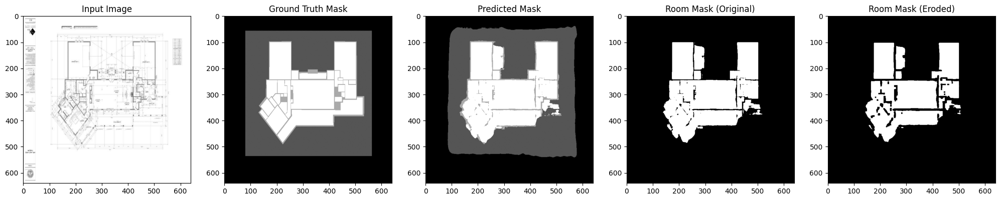

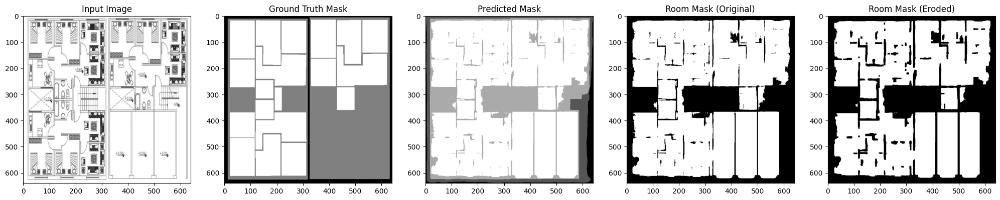

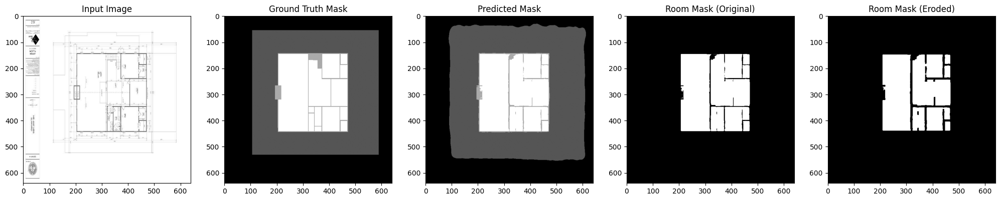

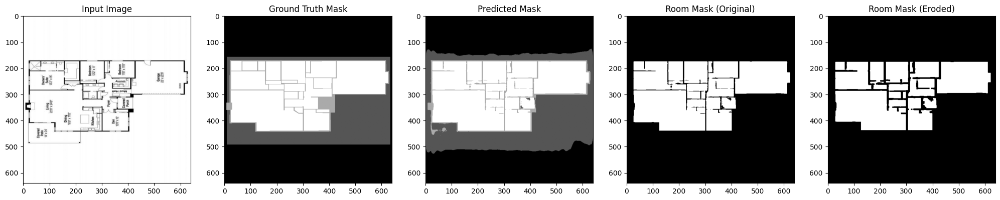

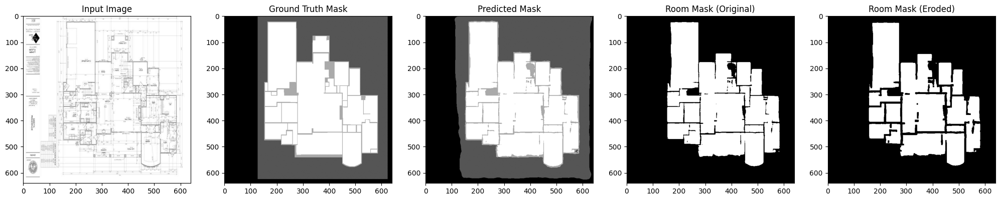

...

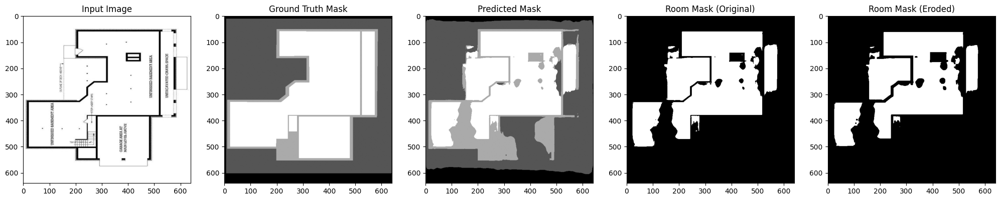

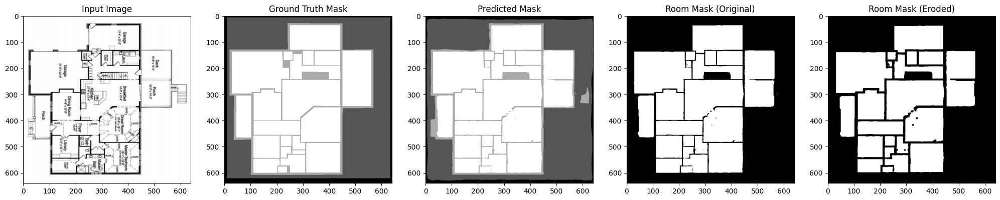

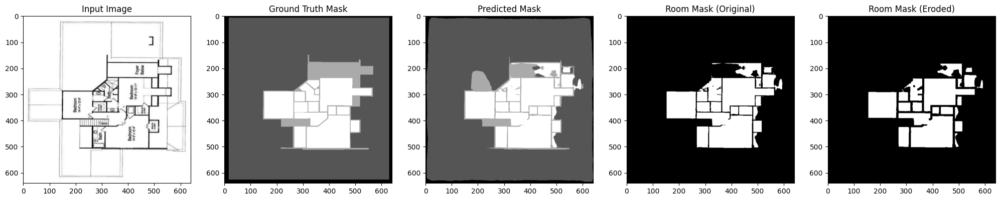

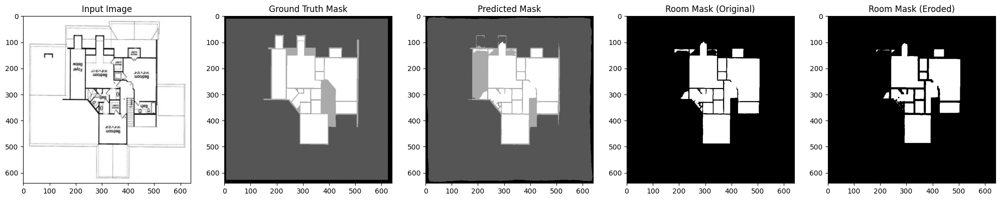

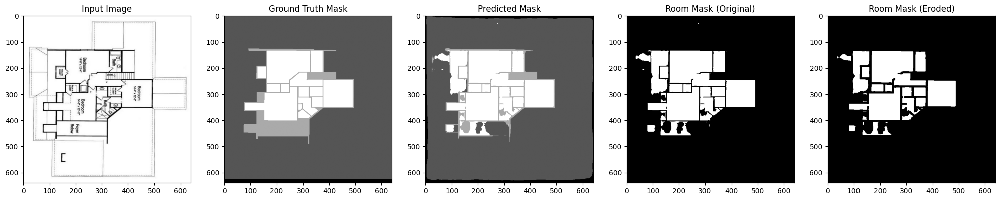

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import label
import cv2

room_class_index = 3  # Index for the 'room' class
model.load_state_dict(torch.load(pth_path, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))
model.eval()

# Iterate over the test data
for images, masks in test_loader:
    images = images.to(device).float()
    masks = masks.to(device).long()
    outputs = model(images)
    preds = torch.argmax(outputs, dim=1)

    # Create a mask only for the 'room' class
    room_preds = (preds == room_class_index).long().cpu().numpy()

    # Apply erosion to the 'room' mask
    kernel = np.ones((5, 5), dtype=np.uint8)  # Adjust kernel size as needed
    eroded_rooms = [cv2.erode(room_pred.astype(np.uint8), kernel, iterations=1) for room_pred in room_preds]

    # Visualization
    for i in range(len(images)):
        plt.figure(figsize=(25, 5))

        # Input image
        plt.subplot(1, 5, 1)
        plt.title("Input Image")
        plt.imshow(images[i].squeeze().cpu(), cmap='gray')  # Adjust shape for grayscale

        # Ground truth mask
        plt.subplot(1, 5, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(masks[i].cpu(), cmap='gray')

        # Predicted mask
        plt.subplot(1, 5, 3)
        plt.title("Predicted Mask")
        plt.imshow(preds[i].cpu(), cmap='gray')

        # Room mask before erosion
        plt.subplot(1, 5, 4)
        plt.title("Room Mask (Original)")
        plt.imshow(room_preds[i], cmap='gray')

        # Room mask after erosion
        plt.subplot(1, 5, 5)
        plt.title("Room Mask (Eroded)")
        plt.imshow(eroded_rooms[i], cmap='gray')

        plt.show()

    break


<ipython-input-22-ad55a484b605>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(pth_path, map_location=torch.device("cuda" if torch.cuda.is

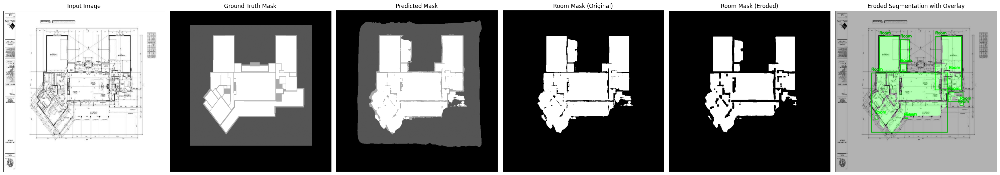

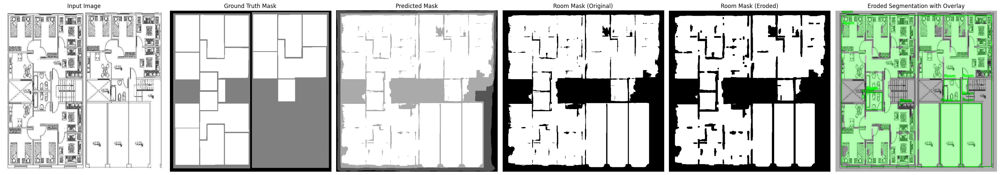

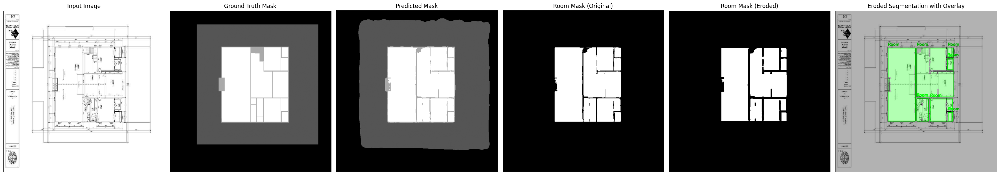

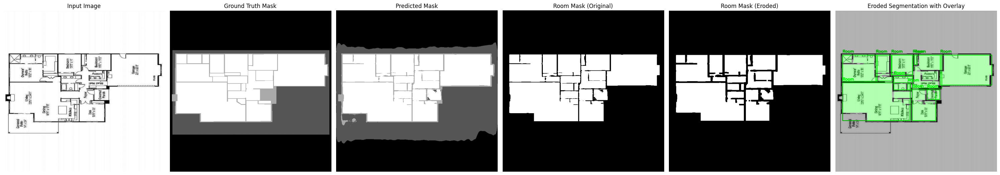

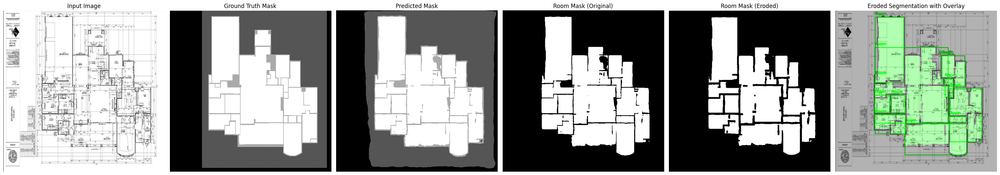

...

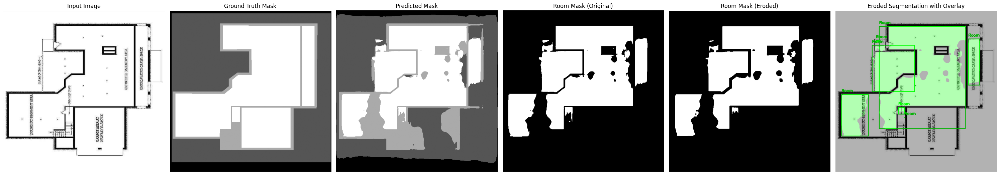

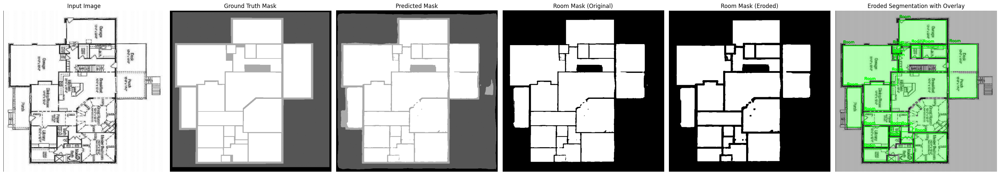

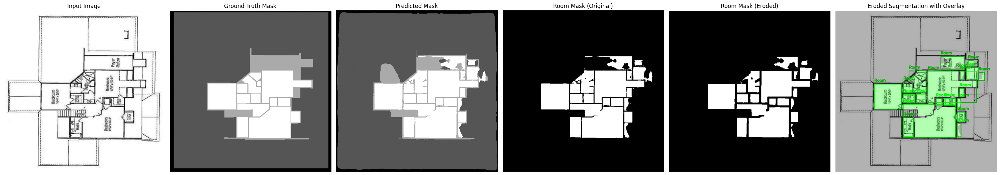

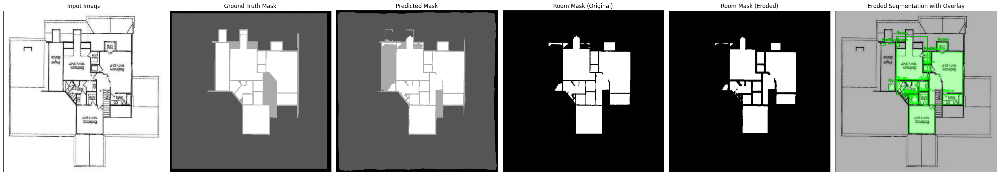

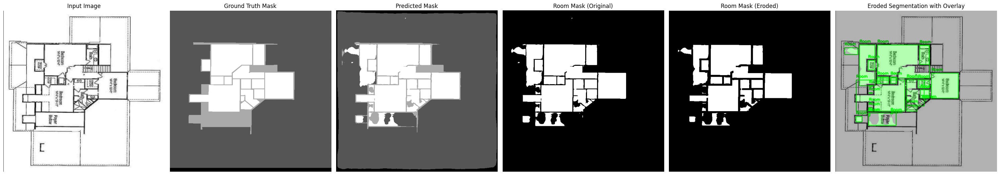

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import label
import cv2

room_class_index = 3  # Index for the 'room' class
model.load_state_dict(torch.load(pth_path, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))
model.eval()

# Iterate over the test data
for images, masks in test_loader:
    images = images.to(device).float()
    masks = masks.to(device).long()
    outputs = model(images)
    preds = torch.argmax(outputs, dim=1)

    # Create a mask only for the 'room' class
    room_preds = (preds == room_class_index).long().cpu().numpy()

    # Apply erosion to the 'room' mask
    kernel = np.ones((5, 5), dtype=np.uint8)  # Adjust kernel size as needed
    eroded_rooms = [cv2.erode(room_pred.astype(np.uint8), kernel, iterations=1) for room_pred in room_preds]

    # Visualization with additional processing
    for i in range(len(images)):
        # Original image
        img = images[i].squeeze().cpu().numpy()
        img = (img * 255).astype(np.uint8)  # Scale image for visualization if needed
        img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR for overlay

        # Eroded room mask
        eroded_mask = eroded_rooms[i]

        # Create a mask overlay
        mask_overlay = np.zeros_like(img_color, dtype=np.uint8)
        mask_overlay[eroded_mask > 0] = (0, 255, 0)  # Green mask for rooms

        # Bounding box and label overlay
        labeled_array, num_features = label(eroded_mask)  # Label connected components
        for label_idx in range(1, num_features + 1):  # Skip background (label 0)
            coords = np.argwhere(labeled_array == label_idx)
            y1, x1 = coords.min(axis=0)
            y2, x2 = coords.max(axis=0)

            # Draw bounding box and label
            cv2.rectangle(img_color, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green bounding box
            cv2.putText(img_color, "Room", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Blend original image with mask overlay
        blended_image = cv2.addWeighted(img_color, 0.7, mask_overlay, 0.3, 0)

        # Plot results
        plt.figure(figsize=(30, 6))

        # Input image
        plt.subplot(1, 6, 1)
        plt.title("Input Image")
        plt.imshow(img, cmap='gray')
        plt.axis('off')

        # Ground truth mask
        plt.subplot(1, 6, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(masks[i].cpu(), cmap='gray')
        plt.axis('off')

        # Predicted mask
        plt.subplot(1, 6, 3)
        plt.title("Predicted Mask")
        plt.imshow(preds[i].cpu(), cmap='gray')
        plt.axis('off')

        # Room mask before erosion
        plt.subplot(1, 6, 4)
        plt.title("Room Mask (Original)")
        plt.imshow(room_preds[i], cmap='gray')
        plt.axis('off')

        # Room mask after erosion
        plt.subplot(1, 6, 5)
        plt.title("Room Mask (Eroded)")
        plt.imshow(eroded_mask, cmap='gray')
        plt.axis('off')

        # Eroded room with bounding boxes
        plt.subplot(1, 6, 6)
        plt.title("Eroded Segmentation with Overlay")
        plt.imshow(cv2.cvtColor(blended_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    break

In [ ]:
from sklearn.metrics import precision_recall_curve, auc
import numpy as np

def compute_iou(pred_mask, true_mask):
    """Compute Intersection over Union (IoU)."""
    intersection = np.logical_and(pred_mask, true_mask).sum()
    union = np.logical_or(pred_mask, true_mask).sum()
    return intersection / union if union > 0 else 0.0

def calculate_map(pred_masks, true_masks, iou_thresholds=np.arange(0.5, 1.0, 0.05)):
    """
    Calculate mAP across IoU thresholds for a single class.

    Args:
        pred_masks (list): List of predicted binary masks.
        true_masks (list): List of ground truth binary masks.
        iou_thresholds (np.array): IoU thresholds from 0.5 to 0.95 (step=0.05).

    Returns:
        float: Mean Average Precision (mAP).
    """
    ap_scores = []

    for iou_thresh in iou_thresholds:
        precisions, recalls = [], []

        for pred_mask, true_mask in zip(pred_masks, true_masks):
            # Flatten masks for precision-recall computation
            pred_flat = pred_mask.flatten()
            true_flat = true_mask.flatten()

            # Compute IoU
            iou = compute_iou(pred_mask, true_mask)

            # Precision and recall are computed for the thresholded IoU
            precision, recall, _ = precision_recall_curve(true_flat, pred_flat)
            ap = auc(recall, precision)
            ap_scores.append(ap)

    return np.mean(ap_scores)

# Example usage:
# Room predictions and ground truth masks for testing
room_predictions = [room_pred for room_pred in room_preds]  # Convert to binary masks
room_ground_truths = [(mask == room_class_index).cpu().numpy() for mask in masks]  # Ground truth binary masks

mAP50_95 = calculate_map(room_predictions, room_ground_truths)
print(f"mAP50-95 for 'room' class: {mAP50_95:.4f}")


mAP50-95 for 'room' class: 0.9359


In [ ]:
for images, masks in test_loader:
    images = images.to(device).float()
    masks = masks.to(device).long()
    outputs = model(images)
    preds = torch.argmax(outputs, dim=1)

    # Compare predictions and masks
    incorrect_mask = (preds != masks)  # Identify incorrect predictions

    # Visualize incorrect predictions
    for i in range(len(images)):
        if incorrect_mask[i].any():  # If there are incorrect predictions in this image
            plt.figure(figsize=(15, 5))
            plt.subplot(1, 3, 1)
            plt.title("Input Image")
            plt.imshow(images[i].cpu().permute(1, 2, 0))  # Adjust shape for RGB

            plt.subplot(1, 3, 2)
            plt.title("Ground Truth Mask")
            plt.imshow(masks[i].cpu(), cmap='gray')

            plt.subplot(1, 3, 3)
            plt.title("Predicted Mask")
            plt.imshow(preds[i].cpu(), cmap='gray')

            plt.show()

    break

In [ ]:
incorrect_ratio = incorrect_mask.sum(dim=(1, 2)) / (640 * 640)  # Pixel-wise error ratio
print(f"Pixel-wise error ratio: {incorrect_ratio}")
print(f"Highest pixel-wise error ratio: {incorrect_ratio.max():.4f}")

--------------------------------------------------------

In [ ]:
torch.save(model.state_dict(), "unet_floorplan_multiclass_batch16_1701_training.pth")
print("Model has been saved.")